In [1]:
#Importing the Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.api import VAR

#Importing plotly functions
import plotly
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

plt.style.use('ggplot')
import math
from functools import reduce
pd.set_option('display.max_columns',200)
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing data
AAL_stock=pd.read_csv('BA_Dataset\Aviation\AAL.csv')
ALK_stock=pd.read_csv('BA_Dataset\Aviation\ALK.csv')
HA_stock=pd.read_csv('BA_Dataset\Aviation\HA.csv')
#Importing data from the Finance sector 
CS_stock=pd.read_csv('BA_Dataset\Finance\CS.csv')
DB_stock=pd.read_csv('BA_Dataset\Finance\DB.csv')
GS_stock=pd.read_csv('BA_Dataset\Finance\GS.csv')
#Importing data from the pharma sector
BHC_stock=pd.read_csv('BA_Dataset\Healthcare_Pharma\BHC.csv')
JNJ_stock=pd.read_csv('BA_Dataset\Healthcare_Pharma\JNJ.csv')
MRK_stock=pd.read_csv('BA_Dataset\Healthcare_Pharma\MRK.csv')
#Importing data from the Technology sector
AAPL_stock=pd.read_csv('BA_Dataset\Technology\AAPL.csv')
GOOG_stock=pd.read_csv('BA_Dataset\Technology\GOOG.csv')
AMZN_stock=pd.read_csv('BA_Dataset\Technology\AMZN.csv')
#Importing the data dictionary 
Annex=pd.read_csv('BA_Dataset\Annexure-I.csv')
#Importing the market index S&P 500
index=pd.read_csv('BA_Dataset\S&P500.csv')

# Step 1: Data Preprocessing

In [3]:
AAL_stock, ALK_stock, HA_stock, CS_stock, DB_stock, GS_stock, AAPL_stock, AAPL_stock, AMZN_stock, 

(            Date   Open   High    Low  Close  Adj Close    Volume
 0     01-10-2010   9.29   9.39   9.21   9.29   8.758067   3603800
 1     04-10-2010   9.24   9.48   9.05   9.12   8.597802   3856800
 2     05-10-2010   9.27   9.35   9.15   9.23   8.701504   3896600
 3     06-10-2010   9.27   9.40   9.15   9.23   8.701504   3230200
 4     07-10-2010   9.30   9.31   9.07   9.24   8.710930   3877700
 ...          ...    ...    ...    ...    ...        ...       ...
 2512  24-09-2020  11.74  12.00  11.22  11.77  11.770000  49163200
 2513  25-09-2020  11.76  12.31  11.71  12.29  12.290000  43764000
 2514  28-09-2020  12.74  13.15  12.49  12.76  12.760000  63558200
 2515  29-09-2020  12.59  12.66  12.11  12.25  12.250000  46994300
 2516  30-09-2020  12.32  12.92  12.22  12.29  12.290000  65055100
 
 [2517 rows x 7 columns],
             Date     Open     High      Low    Close  Adj Close     Volume
 0     01-10-2010  12.9325  12.9625  12.3675  12.4475  10.972344  1663600.0
 1     04-10-201

In [4]:
#Creating dataframes for each updated dataframe with the Adj Close and Volume columns
AAL_stock_updated=pd.DataFrame()
ALK_stock_updated=pd.DataFrame()
HA_stock_updated=pd.DataFrame()
CS_stock_updated=pd.DataFrame()
DB_stock_updated=pd.DataFrame()
GS_stock_updated=pd.DataFrame()
AAPL_stock_updated=pd.DataFrame()
GOOG_stock_updated=pd.DataFrame()
AMZN_stock_updated=pd.DataFrame()
BHC_stock_updated=pd.DataFrame()
JNJ_stock_updated=pd.DataFrame()
MRK_stock_updated=pd.DataFrame()
snp500=pd.DataFrame()

## Checking each company dataframe first before merging together 

In [5]:
#Saving in different dataframes only the selected columns
#From the aviation industry
AAL_stock_updated[['AAL_Adj Close','AAL_Volume','Date']]=AAL_stock[['Adj Close','Volume','Date']].copy()
ALK_stock_updated[['ALK_Adj Close','ALK_Volume','Date']]=ALK_stock[['Adj Close','Volume','Date']].copy()
HA_stock_updated[['HA_Adj Close','HA_Volume','Date']]=HA_stock[['Adj Close','Volume','Date']].copy()
#From the Finance Industry
CS_stock_updated[['CS_Adj Close','CS_Volume','Date']]=CS_stock[['Adj Close','Volume','Date']].copy()
DB_stock_updated[['DB_Adj Close','DB_Volume','Date']]=DB_stock[['Adj Close','Volume','Date']].copy()
GS_stock_updated[['GS_Adj Close','GS_Volume','Date']]=GS_stock[['Adj Close','Volume','Date']].copy()
#From the Technology industry
AAPL_stock_updated[['AAPL_Adj Close','AAPL_Volume','Date']]=AAPL_stock[['Adj Close','Volume','Date']].copy()
GOOG_stock_updated[['GOOG_Adj Close','GOOG_Volume','Date']]=GOOG_stock[['Adj Close','Volume','Date']].copy()
AMZN_stock_updated[['AMZN_Adj Close','AMZN_Volume','Date']]=AMZN_stock[['Adj Close','Volume','Date']].copy()
#From the pharma industry 
BHC_stock_updated[['BHC_Adj Close','BHC_Volume','Date']]=BHC_stock[['Adj Close','Volume','Date']].copy()
JNJ_stock_updated[['JNJ_Adj Close','JNJ_Volume','Date']]=JNJ_stock[['Adj Close','Volume','Date']].copy()
MRK_stock_updated[['MRK_Adj Close','MRK_Volume','Date']]=MRK_stock[['Adj Close','Volume','Date']].copy()
#Index S&P
snp500[['SNP_Adj Close','SNP_Volume','Date']]=index[['Adj Close','Volume','Date']].copy()

In [6]:
#Creating a list of all the dataframes for ease
dataframes=list([AAL_stock_updated,ALK_stock_updated,HA_stock_updated,CS_stock_updated,DB_stock_updated,GS_stock_updated,
                AAPL_stock_updated,GOOG_stock_updated,AMZN_stock_updated,BHC_stock_updated,JNJ_stock_updated,MRK_stock_updated
                ,snp500])

In [7]:
#Printing out the shape for each dataframe it seems the entries are inconsistent
for frames in dataframes:
    print(frames.shape)

(2517, 3)
(2524, 3)
(2524, 3)
(2712, 3)
(2712, 3)
(2712, 3)
(2517, 3)
(2524, 3)
(2524, 3)
(2525, 3)
(2525, 3)
(2525, 3)
(2517, 3)


### We would need to remove these all the missing values since the data for them is irreplaceable

In [8]:
#Dropping all the missing values
for frames in dataframes:
    frames.dropna(inplace=True)

In [9]:
#Checking the shape after dropping the values
for frames in dataframes:
    print(frames.shape)

(2517, 3)
(2517, 3)
(2517, 3)
(2705, 3)
(2705, 3)
(2705, 3)
(2517, 3)
(2517, 3)
(2517, 3)
(2517, 3)
(2517, 3)
(2517, 3)
(2517, 3)


# Step 2: Data Exploration

In [10]:
#Merging the dataframes 
#Using a reduce function and setting the index as Date
stock_final=reduce(lambda left,right:pd.merge(left,right,on=['Date'],how='inner'),dataframes)
stock_final.set_index(['Date'],inplace=True)
stock_final.head()

,AAL_Adj Close,AAL_Volume,ALK_Adj Close,ALK_Volume,HA_Adj Close,HA_Volume,CS_Adj Close,CS_Volume,DB_Adj Close,DB_Volume,GS_Adj Close,GS_Volume,AAPL_Adj Close,AAPL_Volume,GOOG_Adj Close,GOOG_Volume,AMZN_Adj Close,AMZN_Volume,BHC_Adj Close,BHC_Volume,JNJ_Adj Close,JNJ_Volume,MRK_Adj Close,MRK_Volume,SNP_Adj Close,SNP_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,
01-10-2010,8.758067,3603800,10.972344,1663600.0,5.742526,645400.0,30.167257,1814900.0,44.981487,2010600.0,127.147858,7439800.0,8.719163,448142800,261.828613,4466600.0,153.710007,8683400.0,24.757708,5778700.0,45.970119,9773200.0,26.052284,11741900.0,1146.239990,4298910000
04-10-2010,8.597802,3856800,10.703489,1512400.0,5.540189,618900.0,29.943998,1085600.0,44.263348,1245600.0,126.175117,5866700.0,8.599421,435302000,260.199707,3895400.0,155.389999,5346500.0,24.873083,4187200.0,45.910553,8703600.0,25.995331,9234900.0,1137.030029,3604110000
05-10-2010,8.701504,3896600,10.767396,2567200.0,5.636539,534800.0,30.830046,1025300.0,46.140301,2270900.0,128.757706,8724700.0,8.917298,501967200,268.110046,7040400.0,160.869995,5620000.0,25.286512,4610300.0,46.751797,12439400.0,26.351234,10669200.0,1160.750000,4068840000
06-10-2010,8.701504,3230200,10.743157,1043600.0,5.752162,2563900.0,31.032362,871300.0,46.703384,1887400.0,129.850906,6330600.0,8.925013,670868800,266.177307,5545200.0,155.399994,6060800.0,25.661484,4448900.0,47.057022,11339800.0,26.344130,7541300.0,1159.969971,4073160000
07-10-2010,8.710930,3877700,10.247319,7682400.0,5.925593,1115200.0,31.199810,1377000.0,46.213741,1191000.0,130.083435,4471500.0,8.925941,408399600,264.015411,4809400.0,156.270004,4622000.0,25.574951,2453900.0,47.064480,9826600.0,26.130579,13897800.0,1158.060059,3910550000


## Calculating some metrics (Mean, Median, Minimum, Maximum and standard deviation)

In [11]:
#Creating another column for adding in the statistical information
Adjusted_prices_decriptive_statistics=pd.DataFrame()
Adjusted_prices_decriptive_statistics['Companies']=['SnP500','American Airlines Group Inc','Alaska Air Group Inc', 
'Hawaiian Holdings Inc','Credit Suisse','Deutsche Bank', 'Goldman Sachs','Apple Inc', 'Alphabet','Amazon',
                                                    'Bausch Health Companies inc','Johnson & Johnson', 'Merck and CO inc.']
#Calculating the mean
Adjusted_prices_decriptive_statistics['Mean']=[stock_final['SNP_Adj Close'].mean(),stock_final['AAL_Adj Close'].mean(),
                                               stock_final['ALK_Adj Close'].mean(),
                                              stock_final['HA_Adj Close'].mean(),stock_final['CS_Adj Close'].mean(),
                                              stock_final['DB_Adj Close'].mean(),stock_final['GS_Adj Close'].mean(),
                                              stock_final['AAPL_Adj Close'].mean(),stock_final['GOOG_Adj Close'].mean(),
                                              stock_final['AMZN_Adj Close'].mean(),stock_final['BHC_Adj Close'].mean(),
                                              stock_final['JNJ_Adj Close'].mean(),stock_final['MRK_Adj Close'].mean()]
#Calculating the median
Adjusted_prices_decriptive_statistics['Median']=[stock_final['SNP_Adj Close'].median(),stock_final['AAL_Adj Close'].median(),
                                               stock_final['ALK_Adj Close'].median(),
                                              stock_final['HA_Adj Close'].median(),stock_final['CS_Adj Close'].median(),
                                              stock_final['DB_Adj Close'].median(),stock_final['GS_Adj Close'].median(),
                                              stock_final['AAPL_Adj Close'].median(),stock_final['GOOG_Adj Close'].median(),
                                              stock_final['AMZN_Adj Close'].median(),stock_final['BHC_Adj Close'].median(),
                                              stock_final['JNJ_Adj Close'].median(),stock_final['MRK_Adj Close'].median()]
#Calculating the minimum
Adjusted_prices_decriptive_statistics['Min']=[stock_final['SNP_Adj Close'].min(),stock_final['AAL_Adj Close'].min(),
                                               stock_final['ALK_Adj Close'].min(),
                                              stock_final['HA_Adj Close'].min(),stock_final['CS_Adj Close'].min(),
                                              stock_final['DB_Adj Close'].min(),stock_final['GS_Adj Close'].min(),
                                              stock_final['AAPL_Adj Close'].min(),stock_final['GOOG_Adj Close'].min(),
                                              stock_final['AMZN_Adj Close'].min(),stock_final['BHC_Adj Close'].min(),
                                              stock_final['JNJ_Adj Close'].min(),stock_final['MRK_Adj Close'].min()]
#Calculating the maximum
Adjusted_prices_decriptive_statistics['Max']=[stock_final['SNP_Adj Close'].max(),stock_final['AAL_Adj Close'].max(),
                                               stock_final['ALK_Adj Close'].max(),
                                              stock_final['HA_Adj Close'].max(),stock_final['CS_Adj Close'].max(),
                                              stock_final['DB_Adj Close'].max(),stock_final['GS_Adj Close'].max(),
                                              stock_final['AAPL_Adj Close'].max(),stock_final['GOOG_Adj Close'].max(),
                                              stock_final['AMZN_Adj Close'].max(),stock_final['BHC_Adj Close'].max(),
                                              stock_final['JNJ_Adj Close'].max(),stock_final['MRK_Adj Close'].max()]
#Calculating the Standard deviation or risk
Adjusted_prices_decriptive_statistics['Std/Risk']=[stock_final['SNP_Adj Close'].std(),stock_final['AAL_Adj Close'].std(),
                                               stock_final['ALK_Adj Close'].std(),
                                              stock_final['HA_Adj Close'].std(),stock_final['CS_Adj Close'].std(),
                                              stock_final['DB_Adj Close'].std(),stock_final['GS_Adj Close'].std(),
                                              stock_final['AAPL_Adj Close'].std(),stock_final['GOOG_Adj Close'].std(),
                                              stock_final['AMZN_Adj Close'].std(),stock_final['BHC_Adj Close'].std(),
                                              stock_final['JNJ_Adj Close'].std(),stock_final['MRK_Adj Close'].std()]
#Cleaning the values
Adjusted_prices_decriptive_statistics['Mean']=Adjusted_prices_decriptive_statistics['Mean'].round(2)
Adjusted_prices_decriptive_statistics['Median']=Adjusted_prices_decriptive_statistics['Median'].round(2)
Adjusted_prices_decriptive_statistics['Min']=Adjusted_prices_decriptive_statistics['Min'].round(2)
Adjusted_prices_decriptive_statistics['Max']=Adjusted_prices_decriptive_statistics['Max'].round(2)
Adjusted_prices_decriptive_statistics['Std/Risk']=Adjusted_prices_decriptive_statistics['Std/Risk'].round(2)
Adjusted_prices_decriptive_statistics.set_index(['Companies'],inplace=True)

In [12]:
Adjusted_prices_decriptive_statistics

,Mean,Median,Min,Max,Std/Risk
Companies,,,,,
SnP500,2111.39,2071.22,1099.23,3580.84,612.23
American Airlines Group Inc,28.33,31.82,3.77,56.99,14.71
Alaska Air Group Inc,46.89,55.46,10.24,94.47,23.29
Hawaiian Holdings Inc,22.18,21.12,3.64,58.10,14.96
Credit Suisse,17.51,16.71,6.55,33.23,5.73
Deutsche Bank,25.03,26.46,5.48,53.56,13.19
Goldman Sachs,166.67,164.14,76.41,260.14,44.00
Apple Inc,31.78,25.67,8.60,134.18,21.16
Alphabet,730.43,651.79,236.55,1728.28,364.69


In [13]:
stock_final.columns

Index(['AAL_Adj Close', 'AAL_Volume', 'ALK_Adj Close', 'ALK_Volume',
       'HA_Adj Close', 'HA_Volume', 'CS_Adj Close', 'CS_Volume',
       'DB_Adj Close', 'DB_Volume', 'GS_Adj Close', 'GS_Volume',
       'AAPL_Adj Close', 'AAPL_Volume', 'GOOG_Adj Close', 'GOOG_Volume',
       'AMZN_Adj Close', 'AMZN_Volume', 'BHC_Adj Close', 'BHC_Volume',
       'JNJ_Adj Close', 'JNJ_Volume', 'MRK_Adj Close', 'MRK_Volume',
       'SNP_Adj Close', 'SNP_Volume'],
      dtype='object')

## Plotting the Adjusted closing prices of stocks each day sector wise


In [14]:
#Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AAL_Adj Close'],mode='lines+markers',name='AAL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['ALK_Adj Close'],mode='lines+markers',name='ALK'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['HA_Adj Close'],mode='lines+markers',name='HA'))
fig.update_layout(title='Adjusted Closing price for Aviation Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [15]:
#Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['DB_Adj Close'],mode='lines+markers',name='DB'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['GS_Adj Close'],mode='lines+markers',name='GS'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['CS_Adj Close'],mode='lines+markers',name='CS'))
fig.update_layout(title='Adjusted Closing price for Finance Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [16]:
#Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['GOOG_Adj Close'],mode='lines+markers',name='GOOG'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AAPL_Adj Close'],mode='lines+markers',name='AAPL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AMZN_Adj Close'],mode='lines+markers',name='AMZN'))
fig.update_layout(title='Adjusted Closing price for Technology Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [17]:
#Pharma
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['BHC_Adj Close'],mode='lines+markers',name='BHC'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['JNJ_Adj Close'],mode='lines+markers',name='JNJ'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['MRK_Adj Close'],mode='lines+markers',name='MRK'))
fig.update_layout(title='Adjusted Closing price for Pharma Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

## Plotting the volume of stock traded each week

In [18]:
#Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AAL_Volume'],mode='lines+markers',name='AAL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['ALK_Volume'],mode='lines+markers',name='ALK'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['HA_Volume'],mode='lines+markers',name='HA'))
fig.update_layout(title='Volume of Stocks traded for Aviation Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [19]:
#Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['DB_Volume'],mode='lines+markers',name='DB'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['GS_Volume'],mode='lines+markers',name='GS'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['CS_Volume'],mode='lines+markers',name='CS'))
fig.update_layout(title='Volume of Stocks traded for Finance Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [20]:
#Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['GOOG_Volume'],mode='lines+markers',name='GOOG'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AAPL_Volume'],mode='lines+markers',name='AAPL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['AMZN_Volume'],mode='lines+markers',name='AMZN'))
fig.update_layout(title='Volume of Stocks traded for Technology Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [21]:
#Pharma
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['BHC_Volume'],mode='lines+markers',name='BHC'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['JNJ_Volume'],mode='lines+markers',name='JNJ'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['MRK_Volume'],mode='lines+markers',name='MRK'))
fig.update_layout(title='Volume of Stocks traded for Pharma Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

## Calculating daily returns


In [22]:
#Using pct_change function to find the daily change for each company
#Index
stock_final['SNP_Daily Return']=stock_final['SNP_Adj Close'].pct_change()
#Aviation
stock_final['AAL_Daily Return']=stock_final['AAL_Adj Close'].pct_change()
stock_final['ALK_Daily Return']=stock_final['ALK_Adj Close'].pct_change()
stock_final['HA_Daily Return']=stock_final['HA_Adj Close'].pct_change()
#Finance
stock_final['CS_Daily Return']=stock_final['CS_Adj Close'].pct_change()
stock_final['DB_Daily Return']=stock_final['DB_Adj Close'].pct_change()
stock_final['GS_Daily Return']=stock_final['GS_Adj Close'].pct_change()
#Tech
stock_final['AAPL_Daily Return']=stock_final['AAPL_Adj Close'].pct_change()
stock_final['GOOG_Daily Return']=stock_final['GOOG_Adj Close'].pct_change()
stock_final['AMZN_Daily Return']=stock_final['AMZN_Adj Close'].pct_change()
#Pharma
stock_final['BHC_Daily Return']=stock_final['BHC_Adj Close'].pct_change()
stock_final['JNJ_Daily Return']=stock_final['JNJ_Adj Close'].pct_change()
stock_final['MRK_Daily Return']=stock_final['MRK_Adj Close'].pct_change()

In [23]:
#Separating the daily returns values to visualize it
daily_returns=stock_final[['AAL_Daily Return','ALK_Daily Return', 'HA_Daily Return', 'CS_Daily Return',
'DB_Daily Return', 'GS_Daily Return', 'AAPL_Daily Return','GOOG_Daily Return', 'AMZN_Daily Return', 'BHC_Daily Return',
'JNJ_Daily Return', 'MRK_Daily Return']]

In [24]:
#Making a pairplot with all the stocks
#Further dividing the daily'AAL_Daily Return','ALK_Daily Return', 'HA_Daily Return' returns into industry/sector wise
aviation_dr=pd.DataFrame()
finance_dr=pd.DataFrame()
technology_dr=pd.DataFrame()
pharma_dr=pd.DataFrame()

aviation_dr=stock_final[['AAL_Daily Return','ALK_Daily Return', 'HA_Daily Return']]
finance_dr=stock_final[['CS_Daily Return','DB_Daily Return', 'GS_Daily Return']]
technology_dr=stock_final[['AAPL_Daily Return','GOOG_Daily Return', 'AMZN_Daily Return']]
pharma_dr=stock_final[[ 'BHC_Daily Return','JNJ_Daily Return', 'MRK_Daily Return']]

<Figure size 1080x1080 with 0 Axes>

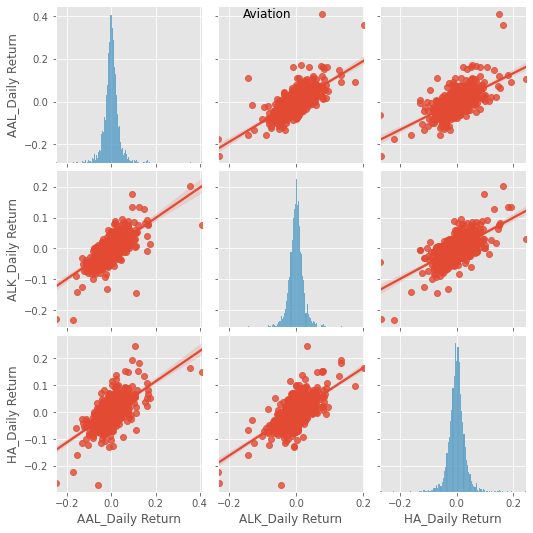

<Figure size 1080x1080 with 0 Axes>

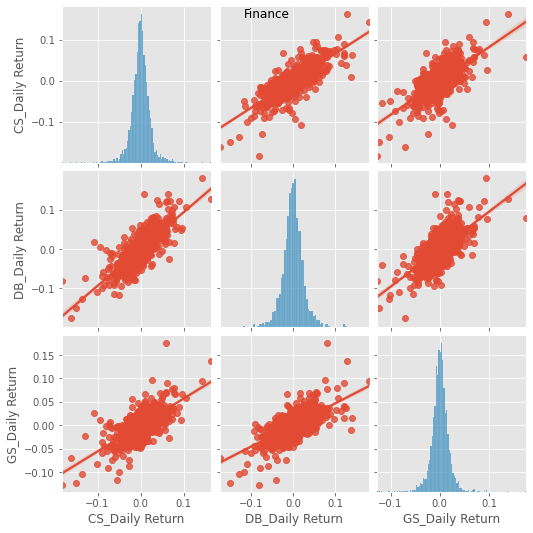

<Figure size 1080x1080 with 0 Axes>

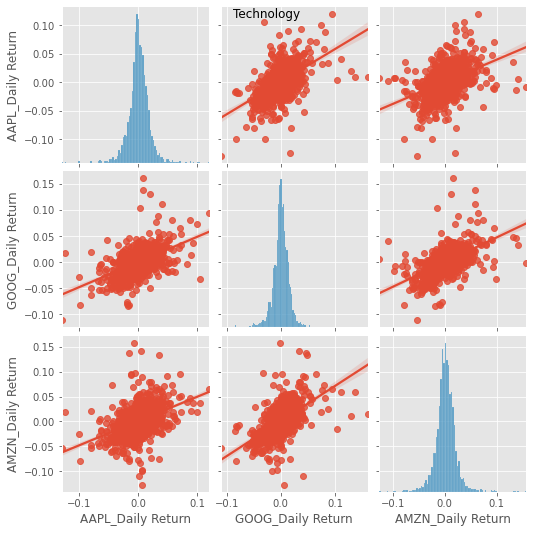

<Figure size 1080x1080 with 0 Axes>

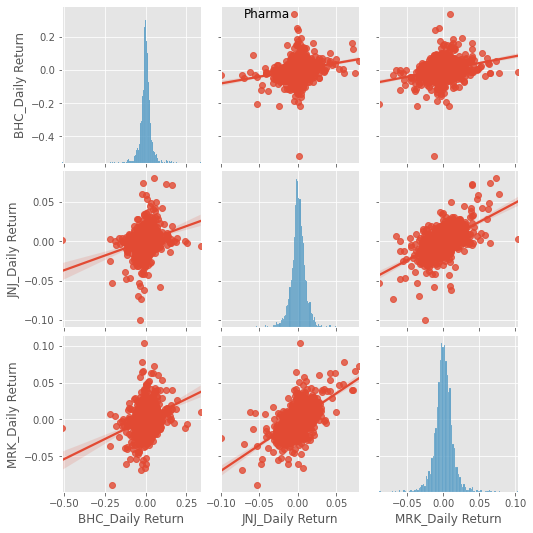

In [25]:
plt.figure(figsize=[15,15])
sns.pairplot(aviation_dr,kind='reg')
plt.suptitle("Aviation")
plt.show()

plt.figure(figsize=[15,15])
sns.pairplot(finance_dr,kind='reg')
plt.suptitle("Finance")
plt.show()

plt.figure(figsize=[15,15])
sns.pairplot(technology_dr,kind='reg')
plt.suptitle("Technology")
plt.show()

plt.figure(figsize=[15,15])
sns.pairplot(pharma_dr,kind='reg')
plt.suptitle("Pharma")
plt.show()

In [26]:
#Making a df for heatmap
heatmap_df=stock_final[['AAL_Adj Close', 'AAL_Volume', 'ALK_Adj Close', 'ALK_Volume',
       'HA_Adj Close', 'HA_Volume', 'CS_Adj Close', 'CS_Volume',
       'DB_Adj Close', 'DB_Volume', 'GS_Adj Close', 'GS_Volume',
       'AAPL_Adj Close', 'AAPL_Volume', 'GOOG_Adj Close', 'GOOG_Volume',
       'AMZN_Adj Close', 'AMZN_Volume', 'BHC_Adj Close', 'BHC_Volume',
       'JNJ_Adj Close', 'JNJ_Volume', 'MRK_Adj Close', 'MRK_Volume',
       'SNP_Adj Close', 'SNP_Volume']]

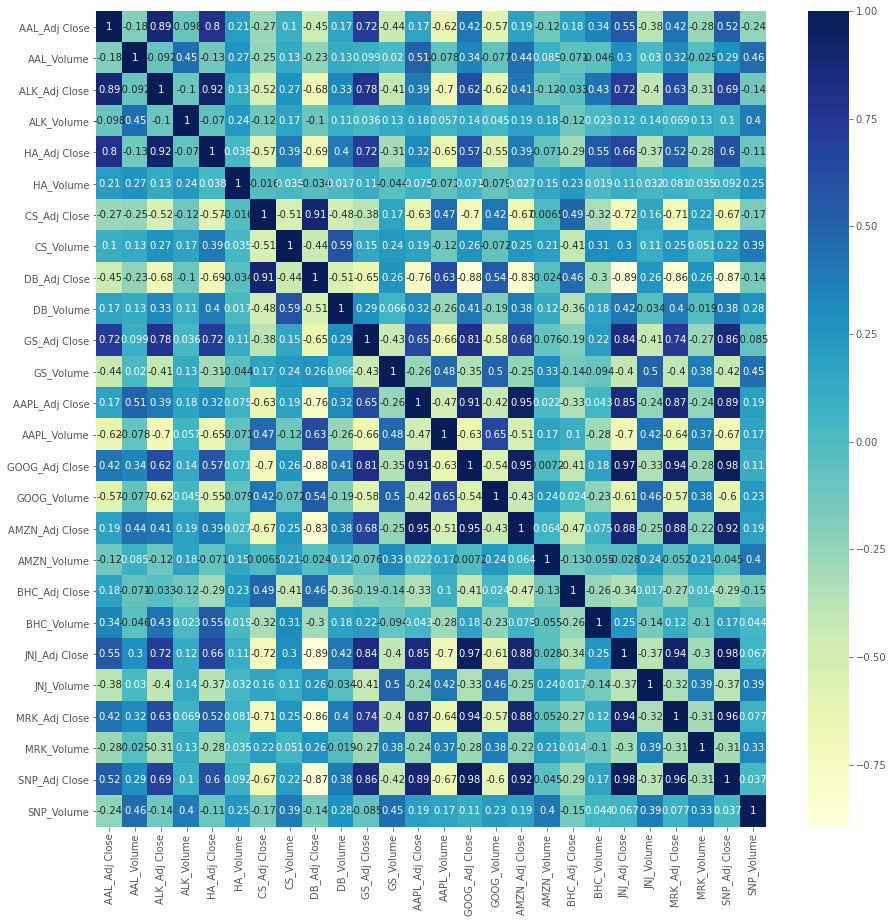

In [27]:
#Plotting a heatmap for the all the companies 
plt.figure(figsize=[15,15])
ax=sns.heatmap(heatmap_df.corr(),annot=True,cmap="YlGnBu")
bottom, top = ax.get_ylim()

## Normalizing the values

In [28]:
#Normalization can be calculated using the current price/the first price entry
stock_final['Normalized_SNP Price']=stock_final['SNP_Adj Close']/stock_final['SNP_Adj Close'].iloc[0]
stock_final['Normalized_AAL Price']=stock_final['AAL_Adj Close']/stock_final['AAL_Adj Close'].iloc[0]
stock_final['Normalized_ALK Price']=stock_final['ALK_Adj Close']/stock_final['ALK_Adj Close'].iloc[0]
stock_final['Normalized_HA Price']=stock_final['HA_Adj Close']/stock_final['HA_Adj Close'].iloc[0]
stock_final['Normalized_CS Price']=stock_final['CS_Adj Close']/stock_final['CS_Adj Close'].iloc[0]
stock_final['Normalized_DB Price']=stock_final['DB_Adj Close']/stock_final['DB_Adj Close'].iloc[0]
stock_final['Normalized_GS Price']=stock_final['GS_Adj Close']/stock_final['GS_Adj Close'].iloc[0]
stock_final['Normalized_AAPL Price']=stock_final['AAPL_Adj Close']/stock_final['AAPL_Adj Close'].iloc[0]
stock_final['Normalized_GOOG Price']=stock_final['GOOG_Adj Close']/stock_final['GOOG_Adj Close'].iloc[0]
stock_final['Normalized_AMZN Price']=stock_final['AMZN_Adj Close']/stock_final['AMZN_Adj Close'].iloc[0]
stock_final['Normalized_BHC Price']=stock_final['BHC_Adj Close']/stock_final['BHC_Adj Close'].iloc[0]
stock_final['Normalized_JNJ Price']=stock_final['JNJ_Adj Close']/stock_final['JNJ_Adj Close'].iloc[0]
stock_final['Normalized_MRK Price']=stock_final['MRK_Adj Close']/stock_final['MRK_Adj Close'].iloc[0]

In [29]:
stock_final.head()

,AAL_Adj Close,AAL_Volume,ALK_Adj Close,ALK_Volume,HA_Adj Close,HA_Volume,CS_Adj Close,CS_Volume,DB_Adj Close,DB_Volume,GS_Adj Close,GS_Volume,AAPL_Adj Close,AAPL_Volume,GOOG_Adj Close,GOOG_Volume,AMZN_Adj Close,AMZN_Volume,BHC_Adj Close,BHC_Volume,JNJ_Adj Close,JNJ_Volume,MRK_Adj Close,MRK_Volume,SNP_Adj Close,SNP_Volume,SNP_Daily Return,AAL_Daily Return,ALK_Daily Return,HA_Daily Return,CS_Daily Return,DB_Daily Return,GS_Daily Return,AAPL_Daily Return,GOOG_Daily Return,AMZN_Daily Return,BHC_Daily Return,JNJ_Daily Return,MRK_Daily Return,Normalized_SNP Price,Normalized_AAL Price,Normalized_ALK Price,Normalized_HA Price,Normalized_CS Price,Normalized_DB Price,Normalized_GS Price,Normalized_AAPL Price,Normalized_GOOG Price,Normalized_AMZN Price,Normalized_BHC Price,Normalized_JNJ Price,Normalized_MRK Price
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
01-10-2010,8.758067,3603800,10.972344,1663600.0,5.742526,645400.0,30.167257,1814900.0,44.981487,2010600.0,127.147858,7439800.0,8.719163,448142800,261.828613,4466600.0,153.710007,8683400.0,24.757708,5778700.0,45.970119,9773200.0,26.052284,11741900.0,1146.239990,4298910000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
04-10-2010,8.597802,3856800,10.703489,1512400.0,5.540189,618900.0,29.943998,1085600.0,44.263348,1245600.0,126.175117,5866700.0,8.599421,435302000,260.199707,3895400.0,155.389999,5346500.0,24.873083,4187200.0,45.910553,8703600.0,25.995331,9234900.0,1137.030029,3604110000,-0.008035,-0.018299,-0.024503,-0.035235,-0.007401,-0.015965,-0.007650,-0.013733,-0.006221,0.010930,0.004660,-0.001296,-0.002186,0.991965,0.981701,0.975497,0.964765,0.992599,0.984035,0.992350,0.986267,0.993779,1.010930,1.004660,0.998704,0.997814
05-10-2010,8.701504,3896600,10.767396,2567200.0,5.636539,534800.0,30.830046,1025300.0,46.140301,2270900.0,128.757706,8724700.0,8.917298,501967200,268.110046,7040400.0,160.869995,5620000.0,25.286512,4610300.0,46.751797,12439400.0,26.351234,10669200.0,1160.750000,4068840000,0.020861,0.012061,0.005971,0.017391,0.029590,0.042404,0.020468,0.036965,0.030401,0.035266,0.016622,0.018324,0.013691,1.012659,0.993542,0.981321,0.981543,1.021970,1.025762,1.012661,1.022724,1.023991,1.046581,1.021359,1.017004,1.011475
06-10-2010,8.701504,3230200,10.743157,1043600.0,5.752162,2563900.0,31.032362,871300.0,46.703384,1887400.0,129.850906,6330600.0,8.925013,670868800,266.177307,5545200.0,155.399994,6060800.0,25.661484,4448900.0,47.057022,11339800.0,26.344130,7541300.0,1159.969971,4073160000,-0.000672,0.000000,-0.002251,0.020513,0.006562,0.012204,0.008490,0.000865,-0.007209,-0.034003,0.014829,0.006529,-0.000270,1.011978,0.993542,0.979112,1.001678,1.028677,1.038280,1.021259,1.023609,1.016609,1.010995,1.036505,1.023644,1.011202
07-10-2010,8.710930,3877700,10.247319,7682400.0,5.925593,1115200.0,31.199810,1377000.0,46.213741,1191000.0,130.083435,4471500.0,8.925941,408399600,264.015411,4809400.0,156.270004,4622000.0,25.574951,2453900.0,47.064480,9826600.0,26.130579,13897800.0,1158.060059,3910550000,-0.001647,0.001083,-0.046154,0.030151,0.005396,-0.010484,0.001791,0.000104,-0.008122,0.005599,-0.003372,0.000158,-0.008106,1.010312,0.994618,0.933923,1.031879,1.034228,1.027395,1.023088,1.023715,1.008352,1.016655,1.033010,1.023806,1.003005


## Plotting the Normalized values

### Dividing the visulizatons into sectors (Aviation, Finance, Technology and Pharma)

In [30]:
#Aviation
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_SNP Price'],mode='lines+markers',name='SNP'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_AAL Price'],mode='lines+markers',name='AAL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_ALK Price'],mode='lines+markers',name='ALK'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_HA Price'],mode='lines+markers',name='HA'))
fig.update_layout(title='Normalized data for Aviation Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [31]:
#Finance
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_SNP Price'],mode='lines+markers',name='SNP'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_DB Price'],mode='lines+markers',name='DB'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_GS Price'],mode='lines+markers',name='GS'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_CS Price'],mode='lines+markers',name='CS'))
fig.update_layout(title='Normalized data for Finance Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [32]:
#Technology
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_SNP Price'],mode='lines+markers',name='SNP'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_GOOG Price'],mode='lines+markers',name='GOOG'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_AAPL Price'],mode='lines+markers',name='AAPL'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_AMZN Price'],mode='lines+markers',name='AMZN'))
fig.update_layout(title='Normalized data for Technology Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

In [33]:
#Pharma
fig=go.Figure()
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_SNP Price'],mode='lines+markers',name='SNP'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_BHC Price'],mode='lines+markers',name='BHC'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_JNJ Price'],mode='lines+markers',name='JNJ'))
fig.add_trace(go.Scatter(x=stock_final.index,y=stock_final['Normalized_MRK Price'],mode='lines+markers',name='MRK'))
fig.update_layout(title='Normalized data for Pharma Sector',xaxis_title='Date',yaxis_title='Normalized Price')
fig.show()

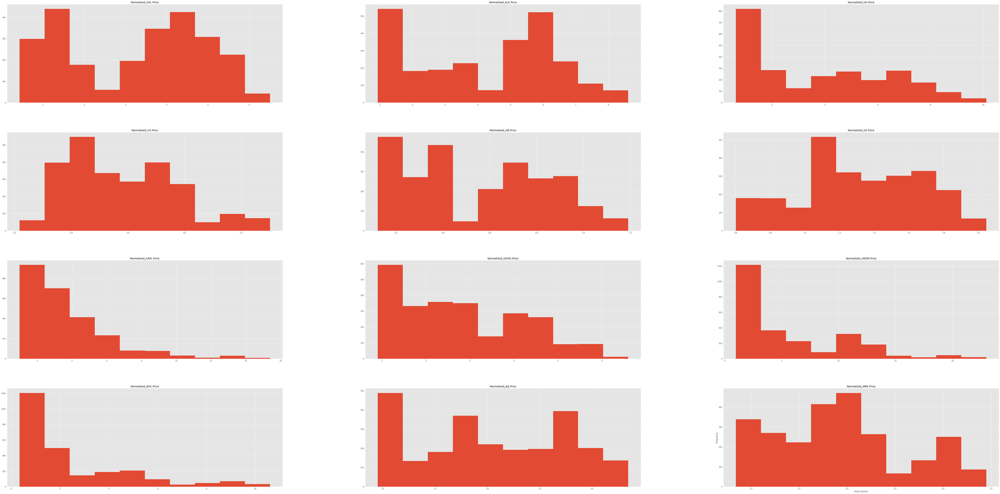

In [34]:
#Plotting the histograms of the for normalized values
tickers=stock_final[['Normalized_AAL Price', 'Normalized_ALK Price', 'Normalized_HA Price',
       'Normalized_CS Price', 'Normalized_DB Price', 'Normalized_GS Price',
       'Normalized_AAPL Price', 'Normalized_GOOG Price',
       'Normalized_AMZN Price', 'Normalized_BHC Price', 'Normalized_JNJ Price',
       'Normalized_MRK Price']]
tickers=tickers.reset_index()
fig=tickers[['Normalized_AAL Price', 'Normalized_ALK Price', 'Normalized_HA Price',
       'Normalized_CS Price', 'Normalized_DB Price', 'Normalized_GS Price',
       'Normalized_AAPL Price', 'Normalized_GOOG Price',
       'Normalized_AMZN Price', 'Normalized_BHC Price', 'Normalized_JNJ Price',
       'Normalized_MRK Price']].hist(figsize=(100,50))
plt.xlabel('Daily returns')
plt.ylabel('Frequency')
plt.show()

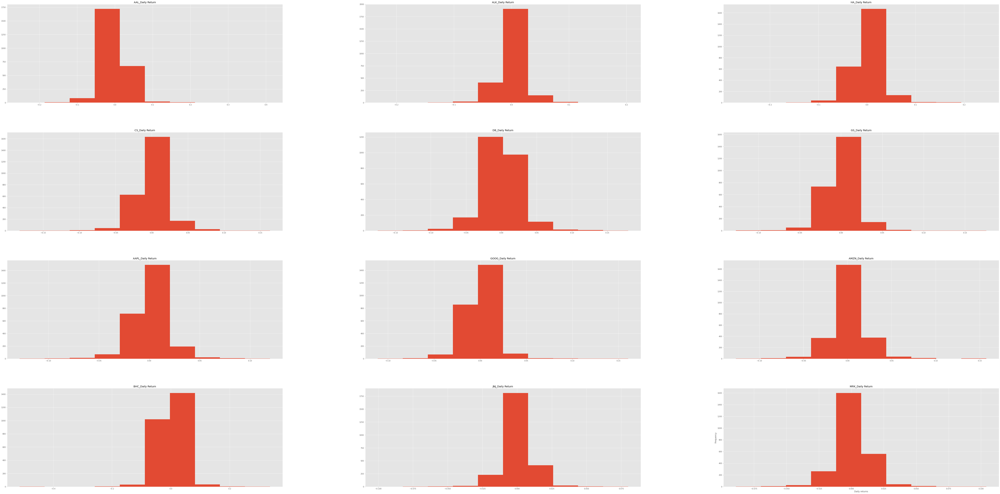

In [35]:
#Plotting the histograms of the for daily returns
tickers=stock_final[['AAL_Daily Return',
       'ALK_Daily Return', 'HA_Daily Return', 'CS_Daily Return',
       'DB_Daily Return', 'GS_Daily Return', 'AAPL_Daily Return',
       'GOOG_Daily Return', 'AMZN_Daily Return', 'BHC_Daily Return',
       'JNJ_Daily Return', 'MRK_Daily Return']]
tickers=tickers.reset_index()
fig=tickers[['AAL_Daily Return',
       'ALK_Daily Return', 'HA_Daily Return', 'CS_Daily Return',
       'DB_Daily Return', 'GS_Daily Return', 'AAPL_Daily Return',
       'GOOG_Daily Return', 'AMZN_Daily Return', 'BHC_Daily Return',
       'JNJ_Daily Return', 'MRK_Daily Return']].hist(figsize=(100,50))
plt.xlabel('Daily returns')
plt.ylabel('Frequency')
plt.show()

# Step 3: Stock Analysis and Portfolio Management - CAPM

## Calculating the daily returns descriptive statistics

In [36]:
#Creating another column for ease
daily_return_descriptive_statistics=pd.DataFrame()
daily_return_descriptive_statistics['Company']=['SnP500','American Airlines Group Inc','Alaska Air Group Inc', 
'Hawaiian Holdings Inc','Credit Suisse','Deutsche Bank', 'Goldman Sachs','Apple Inc', 'Alphabet','Amazon',
                                                'Bausch Health Companies inc','Johnson & Johnson', 'Merck and CO inc.']
#Calculating the mean
daily_return_descriptive_statistics['Mean']=[stock_final['SNP_Daily Return'].mean(),
                                             stock_final['AAL_Daily Return'].mean(), 
stock_final['ALK_Daily Return'].mean(),stock_final['HA_Daily Return'].mean(), stock_final['CS_Daily Return'].mean(),
stock_final['DB_Daily Return'].mean(), stock_final['GS_Daily Return'].mean(), stock_final['AAPL_Daily Return'].mean(), 
stock_final['GOOG_Daily Return'].mean(), stock_final['AMZN_Daily Return'].mean(), stock_final['BHC_Daily Return'].mean(), 
stock_final['JNJ_Daily Return'].mean(), stock_final['MRK_Daily Return'].mean()]

#Calculating the median
daily_return_descriptive_statistics['Median']=[stock_final['SNP_Daily Return'].median(),
stock_final['AAL_Daily Return'].median(), stock_final['ALK_Daily Return'].median(),
stock_final['HA_Daily Return'].median(), stock_final['CS_Daily Return'].median(), stock_final['DB_Daily Return'].median(),
stock_final['GS_Daily Return'].median(), stock_final['AAPL_Daily Return'].median(), stock_final['GOOG_Daily Return'].median(),
stock_final['AMZN_Daily Return'].median(), stock_final['BHC_Daily Return'].median(), stock_final['JNJ_Daily Return'].median(),
stock_final['MRK_Daily Return'].median()]

#Calculating the Minimum
daily_return_descriptive_statistics['Minimum']=[stock_final['SNP_Daily Return'].min(),stock_final['AAL_Daily Return'].min(), 
stock_final['ALK_Daily Return'].min(),
stock_final['HA_Daily Return'].min(), stock_final['CS_Daily Return'].min(), stock_final['DB_Daily Return'].min(),
stock_final['GS_Daily Return'].min(), stock_final['AAPL_Daily Return'].min(), stock_final['GOOG_Daily Return'].min(),
stock_final['AMZN_Daily Return'].min(), stock_final['BHC_Daily Return'].min(), stock_final['JNJ_Daily Return'].min(),
stock_final['MRK_Daily Return'].min()]

#Calculating the Maximum
daily_return_descriptive_statistics['Maximum']=[stock_final['SNP_Daily Return'].max(),stock_final['AAL_Daily Return'].max(), 
stock_final['ALK_Daily Return'].max(),
stock_final['HA_Daily Return'].max(), stock_final['CS_Daily Return'].max(), stock_final['DB_Daily Return'].max(),
stock_final['GS_Daily Return'].max(), stock_final['AAPL_Daily Return'].max(), stock_final['GOOG_Daily Return'].max(),
stock_final['AMZN_Daily Return'].max(), stock_final['BHC_Daily Return'].max(), stock_final['JNJ_Daily Return'].max(),
stock_final['MRK_Daily Return'].max()]

#Calculating the Standard deviation/Risk
daily_return_descriptive_statistics['Std/Risk']=[stock_final['SNP_Daily Return'].std(),stock_final['AAL_Daily Return'].std(), 
stock_final['ALK_Daily Return'].std(),
stock_final['HA_Daily Return'].std(), stock_final['CS_Daily Return'].std(), stock_final['DB_Daily Return'].std(),
stock_final['GS_Daily Return'].std(), stock_final['AAPL_Daily Return'].std(), stock_final['GOOG_Daily Return'].std(),
stock_final['AMZN_Daily Return'].std(), stock_final['BHC_Daily Return'].std(), stock_final['JNJ_Daily Return'].std(),
stock_final['MRK_Daily Return'].std()]

#Calculating the Annulized mean
daily_return_descriptive_statistics['Annulized Returns']=[252*stock_final['SNP_Daily Return'].mean(),
252*stock_final['AAL_Daily Return'].mean(), 252*stock_final['ALK_Daily Return'].mean(),
252*stock_final['HA_Daily Return'].mean(), 252*stock_final['CS_Daily Return'].mean(), 
252*stock_final['DB_Daily Return'].mean(),
252*stock_final['GS_Daily Return'].mean(), 252*stock_final['AAPL_Daily Return'].mean(), 
252*stock_final['GOOG_Daily Return'].mean(),
252*stock_final['AMZN_Daily Return'].mean(), 252*stock_final['BHC_Daily Return'].mean(), 
252*stock_final['JNJ_Daily Return'].mean(),
252*stock_final['MRK_Daily Return'].mean()]

#Calculating the Annulized Annulized Standard deviation/Risk
daily_return_descriptive_statistics['Annulized Std/Risk']=[math.sqrt(252)*stock_final['SNP_Daily Return'].std(),
math.sqrt(252)*stock_final['AAL_Daily Return'].std(), 
math.sqrt(252)*stock_final['ALK_Daily Return'].std(), math.sqrt(252)*stock_final['HA_Daily Return'].std(), 
math.sqrt(252)*stock_final['CS_Daily Return'].std(), math.sqrt(252)*stock_final['DB_Daily Return'].std(),
math.sqrt(252)*stock_final['GS_Daily Return'].std(), math.sqrt(252)*stock_final['AAPL_Daily Return'].std(), 
math.sqrt(252)*stock_final['GOOG_Daily Return'].std(),math.sqrt(252)*stock_final['AMZN_Daily Return'].std(), 
math.sqrt(252)*stock_final['BHC_Daily Return'].std(), math.sqrt(252)*stock_final['JNJ_Daily Return'].std(),
math.sqrt(252)*stock_final['MRK_Daily Return'].std()]

#Calculating the Cumulative returns
daily_return_descriptive_statistics['Cumulative Returns']=[(stock_final['SNP_Adj Close'].iloc[-1]/stock_final['SNP_Adj Close'].iloc[1])-1,
(stock_final['AAL_Adj Close'].iloc[-1]/stock_final['AAL_Adj Close'].iloc[1])-1,
(stock_final['ALK_Adj Close'].iloc[-1]/stock_final['ALK_Adj Close'].iloc[1])-1,
(stock_final['HA_Adj Close'].iloc[-1]/stock_final['HA_Adj Close'].iloc[1])-1,
(stock_final['CS_Adj Close'].iloc[-1]/stock_final['CS_Adj Close'].iloc[1])-1,
(stock_final['DB_Adj Close'].iloc[-1]/stock_final['DB_Adj Close'].iloc[1])-1,
(stock_final['GS_Adj Close'].iloc[-1]/stock_final['GS_Adj Close'].iloc[1])-1,
(stock_final['AAPL_Adj Close'].iloc[-1]/stock_final['AAPL_Adj Close'].iloc[1])-1,
(stock_final['GOOG_Adj Close'].iloc[-1]/stock_final['GOOG_Adj Close'].iloc[1])-1,
(stock_final['AMZN_Adj Close'].iloc[-1]/stock_final['AMZN_Adj Close'].iloc[1])-1,
(stock_final['BHC_Adj Close'].iloc[-1]/stock_final['BHC_Adj Close'].iloc[1])-1,
(stock_final['JNJ_Adj Close'].iloc[-1]/stock_final['JNJ_Adj Close'].iloc[1])-1,
(stock_final['MRK_Adj Close'].iloc[-1]/stock_final['MRK_Adj Close'].iloc[1])-1]

#Cleaning up the code
daily_return_descriptive_statistics['Mean']=(daily_return_descriptive_statistics['Mean']*100).round(3)
daily_return_descriptive_statistics['Median']=(daily_return_descriptive_statistics['Median']*100).round(3)
daily_return_descriptive_statistics['Minimum']=(daily_return_descriptive_statistics['Minimum']).round(3)
daily_return_descriptive_statistics['Maximum']=(daily_return_descriptive_statistics['Maximum']).round(3)
daily_return_descriptive_statistics['Annulized Returns']=(daily_return_descriptive_statistics['Annulized Returns']*100).round(3)
daily_return_descriptive_statistics['Std/Risk']=(daily_return_descriptive_statistics['Std/Risk']*100).round(3)
daily_return_descriptive_statistics['Annulized Std/Risk']=(daily_return_descriptive_statistics['Annulized Std/Risk']*100).round(3)
daily_return_descriptive_statistics['Cumulative Returns']=(daily_return_descriptive_statistics['Cumulative Returns']*100).round(3)

In [37]:
daily_return_descriptive_statistics

,Company,Mean,Median,Minimum,Maximum,Std/Risk,Annulized Returns,Annulized Std/Risk,Cumulative Returns
0,SnP500,0.049,0.065,-0.120,0.094,1.093,12.297,17.357,195.771
1,American Airlines Group Inc,0.066,0.024,-0.252,0.411,3.272,16.637,51.946,42.944
2,Alaska Air Group Inc,0.076,0.090,-0.232,0.203,2.357,19.146,37.412,242.225
3,Hawaiian Holdings Inc,0.078,0.045,-0.270,0.246,3.015,19.654,47.857,132.664
4,Credit Suisse,-0.019,0.000,-0.183,0.163,2.214,-4.863,35.139,-66.705
5,Deutsche Bank,-0.032,-0.045,-0.175,0.180,2.634,-8.069,41.813,-81.023
6,Goldman Sachs,0.035,0.060,-0.127,0.176,1.833,8.820,29.091,59.279
7,Apple Inc,0.119,0.092,-0.129,0.120,1.771,29.875,28.106,1246.719
8,Alphabet,0.082,0.066,-0.111,0.161,1.629,20.602,25.856,464.797
9,Amazon,0.140,0.111,-0.127,0.157,1.989,35.220,31.574,1926.340


## Performing Logistic regression to find out the beta values of each stock

In [38]:
#Making another dataframe with daily returns since we need to drop the NaN values from the first row
Daily_returns_df=stock_final[['SNP_Daily Return', 'AAL_Daily Return',
       'ALK_Daily Return', 'HA_Daily Return', 'CS_Daily Return',
       'DB_Daily Return', 'GS_Daily Return', 'AAPL_Daily Return',
       'GOOG_Daily Return', 'AMZN_Daily Return', 'BHC_Daily Return',
       'JNJ_Daily Return', 'MRK_Daily Return']]
Daily_returns_df=Daily_returns_df.dropna()

In [39]:
#Building a linear regression model with AAL_Daily Return to find the beta value
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['AAL_Daily Return']
X_sm=sm.add_constant(X)
lr_AAL=sm.OLS(y,X_sm).fit()
print('AAL',lr_AAL.summary())
#Building a linear regression model with ALK daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['ALK_Daily Return']
X_sm=sm.add_constant(X)
lr_ALK=sm.OLS(y,X_sm).fit()
print('ALK',lr_ALK.summary())
#Building a linear regression model with HA daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['HA_Daily Return']
X_sm=sm.add_constant(X)
lr_HA=sm.OLS(y,X_sm).fit()
print('HA',lr_HA.summary())

#Building a linear regression model with CS daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['CS_Daily Return']
X_sm=sm.add_constant(X)
lr_CS=sm.OLS(y,X_sm).fit()
print('CS',lr_CS.summary())
#Building a linear regression model with DB daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['DB_Daily Return']
X_sm=sm.add_constant(X)
lr_DB=sm.OLS(y,X_sm).fit()
print('DB',lr_DB.summary())
#Building a linear regression model with GS daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['GS_Daily Return']
X_sm=sm.add_constant(X)
lr_GS=sm.OLS(y,X_sm).fit()
print('GS',lr_GS.summary())

#Building a linear regression model with AAPL daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['AAPL_Daily Return']
X_sm=sm.add_constant(X)
lr_AAPL=sm.OLS(y,X_sm).fit()
print('AAPL',lr_AAPL.summary())
#Building a linear regression model with GOOG daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['GOOG_Daily Return']
X_sm=sm.add_constant(X)
lr_GOOG=sm.OLS(y,X_sm).fit()
print('GOOG',lr_GOOG.summary())
#Building a linear regression model with AMZN daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['AMZN_Daily Return']
X_sm=sm.add_constant(X)
lr_AMZN=sm.OLS(y,X_sm).fit()
print('AMZN',lr_AMZN.summary())

#Building a linear regression model with BHC daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['BHC_Daily Return']
X_sm=sm.add_constant(X)
lr_BHC=sm.OLS(y,X_sm).fit()
print('BHC',lr_BHC.summary())
#Building a linear regression model with JNJ daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['JNJ_Daily Return']
X_sm=sm.add_constant(X)
lr_JNJ=sm.OLS(y,X_sm).fit()
print('JNJ',lr_JNJ.summary())
#Building a linear regression model with MRK daily returns
X=Daily_returns_df['SNP_Daily Return']
y=Daily_returns_df['MRK_Daily Return']
X_sm=sm.add_constant(X)
lr_MRK=sm.OLS(y,X_sm).fit()
print('MRK',lr_MRK.summary())


AAL                             OLS Regression Results                            
Dep. Variable:       AAL_Daily Return   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.204
Method:                 Least Squares   F-statistic:                     646.2
Date:                Sun, 13 Jun 2021   Prob (F-statistic):          4.57e-127
Time:                        22:57:51   Log-Likelihood:                 5322.2
No. Observations:                2516   AIC:                        -1.064e+04
Df Residuals:                    2514   BIC:                        -1.063e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -1.524e-07      0.0

## Calculating the Expected Returns

In [40]:
#Creating a variable with each stock beta
AAL_beta=1.352
ALK_beta=1.232
HA_beta=1.234
CS_beta=1.373
DB_beta=1.536
GS_beta=1.302
AAPL_beta=1.063
GOOG_beta=1.013
AMZN_beta=0.999
BHC_beta=1.317
JNJ_beta=0.6640
MRK_beta=0.737

In [41]:
#Creating another column for each to find the beta values of each stock and their expected returns
Results_df=pd.DataFrame()
Results_df['Companies']=['American Airlines Group Inc','Alaska Air Group Inc', 
'Hawaiian Holdings Inc','Credit Suisse','Deutsche Bank', 'Goldman Sachs','Apple Inc', 'Alphabet','Amazon',
                         'Bausch Health Companies inc','Johnson & Johnson', 'Merck and CO inc.']
Results_df['Beta Values']=[AAL_beta,ALK_beta,HA_beta,CS_beta,DB_beta,GS_beta,AAPL_beta,GOOG_beta,AMZN_beta,BHC_beta,
                          JNJ_beta,MRK_beta]
Results_df['Expected Returns']=[0.75+AAL_beta*(12.3-0.75),
                                0.75+ALK_beta*(12.3-0.75),
                                0.75+HA_beta*(12.3-0.75),
                                0.75+CS_beta*(12.3-0.75),
                                0.75+DB_beta*(12.3-0.75),
                                0.75+GS_beta*(12.3-0.75),
                                0.75+AAPL_beta*(12.3-0.75),
                                0.75+GOOG_beta*(12.3-0.75),
                                0.75+AMZN_beta*(12.3-0.75),
                                0.75+BHC_beta*(12.3-0.75),
                                0.75+JNJ_beta*(12.3-0.75),
                                0.75+MRK_beta*(12.3-0.75)]
Results_df['Expected Returns']=Results_df['Expected Returns'].round(3)
Results_df

,Companies,Beta Values,Expected Returns
0,American Airlines Group Inc,1.352,16.366
1,Alaska Air Group Inc,1.232,14.980
2,Hawaiian Holdings Inc,1.234,15.003
3,Credit Suisse,1.373,16.608
4,Deutsche Bank,1.536,18.491
5,Goldman Sachs,1.302,15.788
6,Apple Inc,1.063,13.028
7,Alphabet,1.013,12.450
8,Amazon,0.999,12.288
9,Bausch Health Companies inc,1.317,15.961


In [42]:
#Dividing the portfolio by the number of stocks present in the table
Results_df['Portfolio']=1/len(Results_df)
Results_df=Results_df.set_index(['Companies'])

In [43]:
Results_df

,Beta Values,Expected Returns,Portfolio
Companies,,,
American Airlines Group Inc,1.352,16.366,0.083333
Alaska Air Group Inc,1.232,14.980,0.083333
Hawaiian Holdings Inc,1.234,15.003,0.083333
Credit Suisse,1.373,16.608,0.083333
Deutsche Bank,1.536,18.491,0.083333
Goldman Sachs,1.302,15.788,0.083333
Apple Inc,1.063,13.028,0.083333
Alphabet,1.013,12.450,0.083333
Amazon,0.999,12.288,0.083333


## Calculating the beta portfolio

In [44]:
#Calculating the Portfolio Beta
Portfolio_beta=sum(Results_df['Beta Values']*Results_df['Portfolio'])
print(np.round(Portfolio_beta,3))

1.152


In [45]:
#Adding only the companies below to the portfolio to calculate the portfolio beta
Results_df_updated=Results_df.drop(["American Airlines Group Inc","Credit Suisse","Deutsche Bank",
"Johnson & Johnson","Merck and CO inc.","Bausch Health Companies inc"])
Results_df_updated['Portfolio']=(1/len(Results_df_updated))
Results_df_updated

,Beta Values,Expected Returns,Portfolio
Companies,,,
Alaska Air Group Inc,1.232,14.980,0.166667
Hawaiian Holdings Inc,1.234,15.003,0.166667
Goldman Sachs,1.302,15.788,0.166667
Apple Inc,1.063,13.028,0.166667
Alphabet,1.013,12.450,0.166667
Amazon,0.999,12.288,0.166667


In [46]:
#Calculating the new portfolio beta
Results_df_updated['Portfolio']=(1/len(Results_df_updated))
Portfolio_beta_updated=sum(Results_df_updated['Beta Values']*Results_df_updated['Portfolio'])
print(np.round(Portfolio_beta_updated,3))

1.14


In [47]:
#Calculating the Expected return based on the returns of the above companies
Expected_Portfolio_Return=0.75+Portfolio_beta_updated*(12.3-0.75)
print(np.round(Expected_Portfolio_Return,3))

13.923


# Step 4: Stock Price Prediction - Validation

In [48]:
stock_final.head()

,AAL_Adj Close,AAL_Volume,ALK_Adj Close,ALK_Volume,HA_Adj Close,HA_Volume,CS_Adj Close,CS_Volume,DB_Adj Close,DB_Volume,GS_Adj Close,GS_Volume,AAPL_Adj Close,AAPL_Volume,GOOG_Adj Close,GOOG_Volume,AMZN_Adj Close,AMZN_Volume,BHC_Adj Close,BHC_Volume,JNJ_Adj Close,JNJ_Volume,MRK_Adj Close,MRK_Volume,SNP_Adj Close,SNP_Volume,SNP_Daily Return,AAL_Daily Return,ALK_Daily Return,HA_Daily Return,CS_Daily Return,DB_Daily Return,GS_Daily Return,AAPL_Daily Return,GOOG_Daily Return,AMZN_Daily Return,BHC_Daily Return,JNJ_Daily Return,MRK_Daily Return,Normalized_SNP Price,Normalized_AAL Price,Normalized_ALK Price,Normalized_HA Price,Normalized_CS Price,Normalized_DB Price,Normalized_GS Price,Normalized_AAPL Price,Normalized_GOOG Price,Normalized_AMZN Price,Normalized_BHC Price,Normalized_JNJ Price,Normalized_MRK Price
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
01-10-2010,8.758067,3603800,10.972344,1663600.0,5.742526,645400.0,30.167257,1814900.0,44.981487,2010600.0,127.147858,7439800.0,8.719163,448142800,261.828613,4466600.0,153.710007,8683400.0,24.757708,5778700.0,45.970119,9773200.0,26.052284,11741900.0,1146.239990,4298910000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
04-10-2010,8.597802,3856800,10.703489,1512400.0,5.540189,618900.0,29.943998,1085600.0,44.263348,1245600.0,126.175117,5866700.0,8.599421,435302000,260.199707,3895400.0,155.389999,5346500.0,24.873083,4187200.0,45.910553,8703600.0,25.995331,9234900.0,1137.030029,3604110000,-0.008035,-0.018299,-0.024503,-0.035235,-0.007401,-0.015965,-0.007650,-0.013733,-0.006221,0.010930,0.004660,-0.001296,-0.002186,0.991965,0.981701,0.975497,0.964765,0.992599,0.984035,0.992350,0.986267,0.993779,1.010930,1.004660,0.998704,0.997814
05-10-2010,8.701504,3896600,10.767396,2567200.0,5.636539,534800.0,30.830046,1025300.0,46.140301,2270900.0,128.757706,8724700.0,8.917298,501967200,268.110046,7040400.0,160.869995,5620000.0,25.286512,4610300.0,46.751797,12439400.0,26.351234,10669200.0,1160.750000,4068840000,0.020861,0.012061,0.005971,0.017391,0.029590,0.042404,0.020468,0.036965,0.030401,0.035266,0.016622,0.018324,0.013691,1.012659,0.993542,0.981321,0.981543,1.021970,1.025762,1.012661,1.022724,1.023991,1.046581,1.021359,1.017004,1.011475
06-10-2010,8.701504,3230200,10.743157,1043600.0,5.752162,2563900.0,31.032362,871300.0,46.703384,1887400.0,129.850906,6330600.0,8.925013,670868800,266.177307,5545200.0,155.399994,6060800.0,25.661484,4448900.0,47.057022,11339800.0,26.344130,7541300.0,1159.969971,4073160000,-0.000672,0.000000,-0.002251,0.020513,0.006562,0.012204,0.008490,0.000865,-0.007209,-0.034003,0.014829,0.006529,-0.000270,1.011978,0.993542,0.979112,1.001678,1.028677,1.038280,1.021259,1.023609,1.016609,1.010995,1.036505,1.023644,1.011202
07-10-2010,8.710930,3877700,10.247319,7682400.0,5.925593,1115200.0,31.199810,1377000.0,46.213741,1191000.0,130.083435,4471500.0,8.925941,408399600,264.015411,4809400.0,156.270004,4622000.0,25.574951,2453900.0,47.064480,9826600.0,26.130579,13897800.0,1158.060059,3910550000,-0.001647,0.001083,-0.046154,0.030151,0.005396,-0.010484,0.001791,0.000104,-0.008122,0.005599,-0.003372,0.000158,-0.008106,1.010312,0.994618,0.933923,1.031879,1.034228,1.027395,1.023088,1.023715,1.008352,1.016655,1.033010,1.023806,1.003005


In [66]:
#Creating the dataframe
forecast_df=stock_final[['ALK_Adj Close', 'HA_Adj Close','GS_Adj Close','AAPL_Adj Close', 'GOOG_Adj Close', 
'AMZN_Adj Close','ALK_Volume','HA_Volume', 'GS_Volume','AAPL_Volume','GOOG_Volume','AMZN_Volume']]
forecast_df=forecast_df.reset_index()
#forecast_df=forecast_df.drop(['Date'],axis=1)
forecast_df['Date']=pd.to_datetime(forecast_df['Date'],format='%d-%m-%Y')
forecast_df=forecast_df.set_index('Date')
forecast_df.head()

,ALK_Adj Close,HA_Adj Close,GS_Adj Close,AAPL_Adj Close,GOOG_Adj Close,AMZN_Adj Close,ALK_Volume,HA_Volume,GS_Volume,AAPL_Volume,GOOG_Volume,AMZN_Volume
Date,,,,,,,,,,,,
2010-10-01,10.972344,5.742526,127.147858,8.719163,261.828613,153.710007,1663600.0,645400.0,7439800.0,448142800,4466600.0,8683400.0
2010-10-04,10.703489,5.540189,126.175117,8.599421,260.199707,155.389999,1512400.0,618900.0,5866700.0,435302000,3895400.0,5346500.0
2010-10-05,10.767396,5.636539,128.757706,8.917298,268.110046,160.869995,2567200.0,534800.0,8724700.0,501967200,7040400.0,5620000.0
2010-10-06,10.743157,5.752162,129.850906,8.925013,266.177307,155.399994,1043600.0,2563900.0,6330600.0,670868800,5545200.0,6060800.0
2010-10-07,10.247319,5.925593,130.083435,8.925941,264.015411,156.270004,7682400.0,1115200.0,4471500.0,408399600,4809400.0,4622000.0


In [67]:
#Check for stationarity 
from statsmodels.tsa.stattools import kpss

for col in forecast_df.columns:
    kpss_test = kpss(forecast_df[col])
    
    print(col)
    print('KPSS Statistic: %f' % kpss_test[0])
    print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
    print('p-value: %f' % kpss_test[1])
    
    if kpss_test[1] <= 0.05:
        print("\nSeries is Stationary")
    else:
        print("\nSeries is Non-Stationary")
        
    print('\n--------------------------------------\n')

ALK_Adj Close
KPSS Statistic: 5.946983
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

HA_Adj Close
KPSS Statistic: 5.354893
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

GS_Adj Close
KPSS Statistic: 6.629594
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

AAPL_Adj Close
KPSS Statistic: 6.823155
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

GOOG_Adj Close
KPSS Statistic: 8.721507
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

AMZN_Adj Close
KPSS Statistic: 7.681389
Critical Values @ 0.05: 0.46
p-value: 0.010000

Series is Stationary

--------------------------------------

ALK_Volume
KPSS Statistic: 0.573942
Critical Values @ 0.05: 0.46
p-value: 0.025013

Series is Stationary


In [68]:
#Performing the train and test split
train_len=int(forecast_df.shape[0]*0.7)
test_len=int(forecast_df.shape[0])-int(forecast_df.shape[0]*0.7)

#Train data and Test data
train_data=forecast_df[:train_len]
test_data=forecast_df[train_len:]
model=VAR(train_data)

In [69]:
#Select the lag order 
x=model.select_order(maxlags=50)
x.summary()

,AIC,BIC,FPE,HQIC
0,213.6,213.6,5.586e+92,213.6
1,182.4,182.9*,1.578e+79,182.5*
2,182.3*,183.3,1.509e+79*,182.7
3,182.3,183.8,1.542e+79,182.9
4,182.4,184.2,1.606e+79,183.1
5,182.4,184.8,1.697e+79,183.3
6,182.5,185.3,1.806e+79,183.5
7,182.5,185.8,1.895e+79,183.7
8,182.6,186.3,2.024e+79,184.0
9,182.7,186.8,2.143e+79,184.2


In [70]:
# Providing maxlags as 26 (minimum AIC vaue)
results = model.fit(maxlags = 2, ic = 'aic')

In [71]:
#Printing the summary
results.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 13, Jun, 2021
Time:                     22:58:53
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                    183.267
Nobs:                     1759.00    HQIC:                   182.679
Log likelihood:          -190014.    FPE:                1.53718e+79
AIC:                      182.334    Det(Omega_mle):     1.29771e+79
--------------------------------------------------------------------
Results for equation ALK_Adj Close
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                    -0.229827         0.215570           -1.066           0.286
L1.ALK_Adj Close          0.959871         0.029253           32.813           0.000
L1.HA_Adj Close           0.002945  

In [72]:
lag_order=2

In [73]:
#Performing the predictions
predicted=results.forecast(train_data.values[-lag_order:],test_len)
forecast=pd.DataFrame(predicted,index=forecast_df.index[train_len:],columns=forecast_df.columns)

In [74]:
forecast.head()

,ALK_Adj Close,HA_Adj Close,GS_Adj Close,AAPL_Adj Close,GOOG_Adj Close,AMZN_Adj Close,ALK_Volume,HA_Volume,GS_Volume,AAPL_Volume,GOOG_Volume,AMZN_Volume
Date,,,,,,,,,,,,
2017-09-29,71.957274,35.608196,222.907383,36.740315,948.724310,955.441615,1.316092e+06,1.295576e+06,1.900089e+06,1.056096e+08,1.102669e+06,2.123374e+06
2017-10-02,71.949232,35.560842,223.109463,36.698299,948.344098,953.700101,1.310516e+06,1.203031e+06,1.548607e+06,1.141786e+08,1.220040e+06,2.282864e+06
2017-10-03,71.905440,35.491376,223.209738,36.655192,948.058941,952.465877,1.322914e+06,1.102235e+06,1.456379e+06,1.182821e+08,1.238995e+06,2.226332e+06
2017-10-04,71.860017,35.419661,223.291564,36.612652,947.800725,951.194633,1.318757e+06,1.050543e+06,1.412351e+06,1.239466e+08,1.205451e+06,2.122344e+06
2017-10-05,71.810519,35.346295,223.352459,36.570275,947.546885,949.980929,1.316834e+06,1.019404e+06,1.394451e+06,1.277604e+08,1.173027e+06,2.032380e+06


## Comparing the Train, Test and Forecast Values

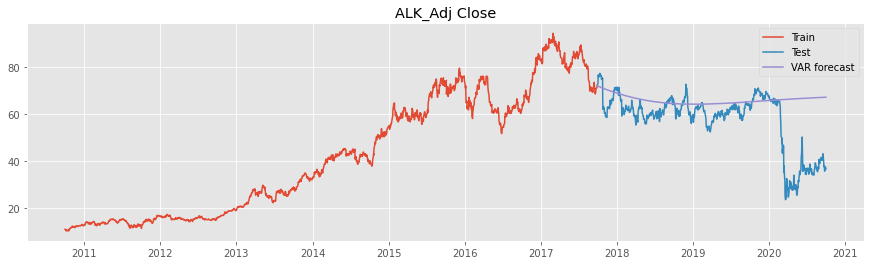

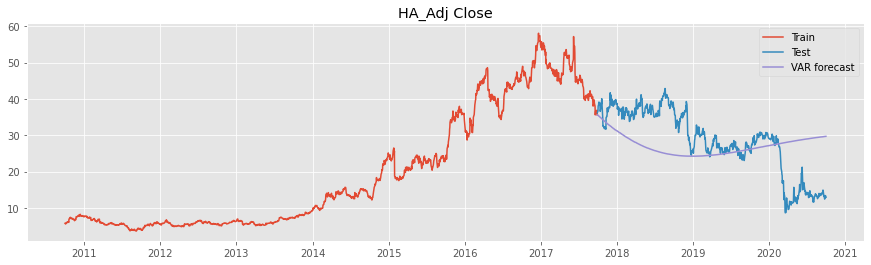

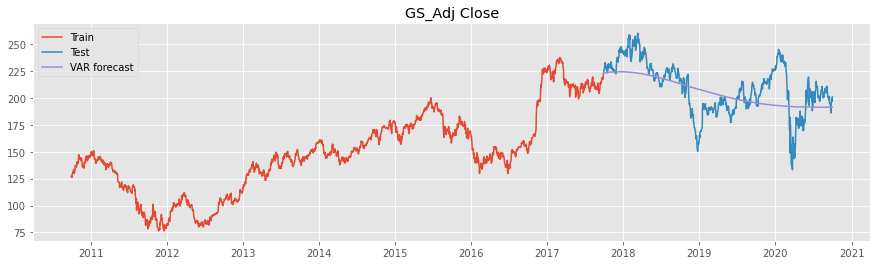

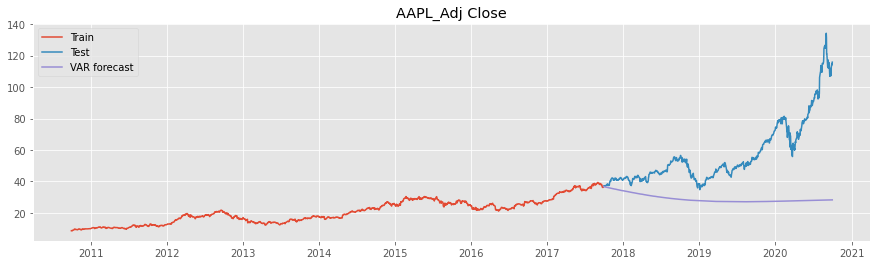

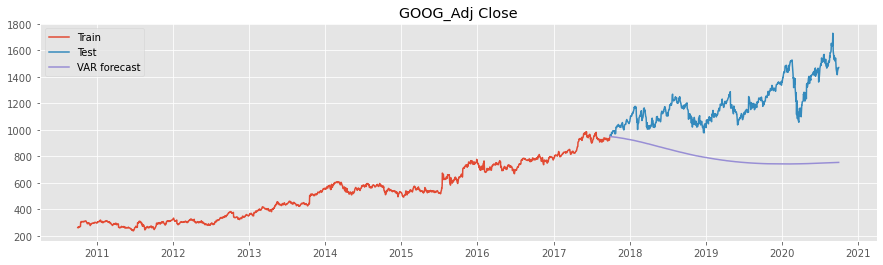

...

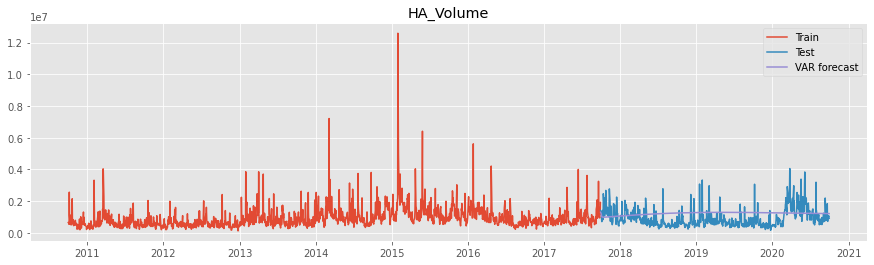

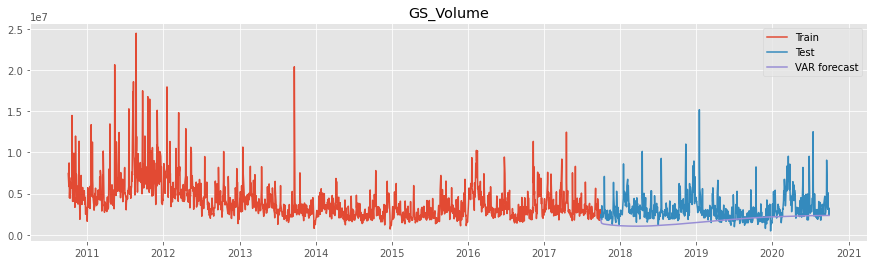

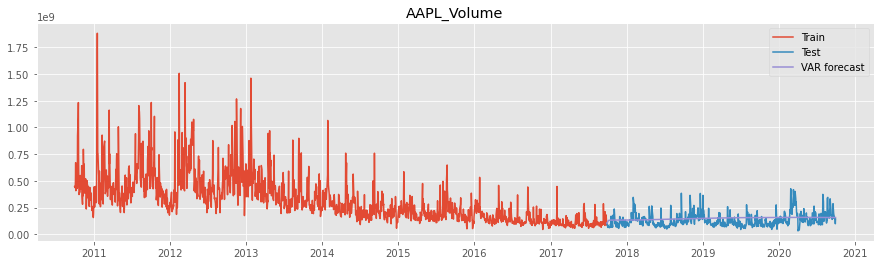

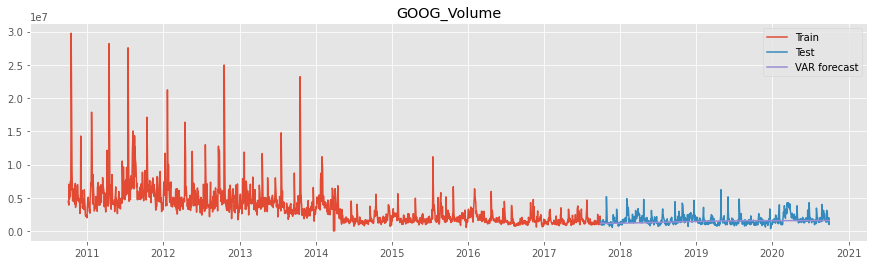

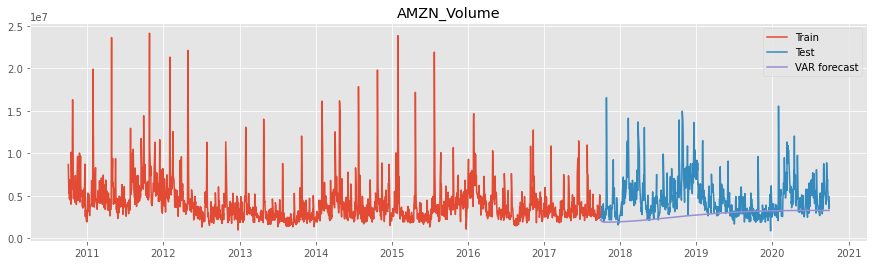

In [75]:
# Printing the train, test and forecasted values
for col in forecast_df.columns:
    plt.figure(figsize=(15,4))
    plt.plot(forecast_df[col][:train_len], label='Train')
    plt.plot(forecast_df[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

## Comparing the Test and Forecast Values 

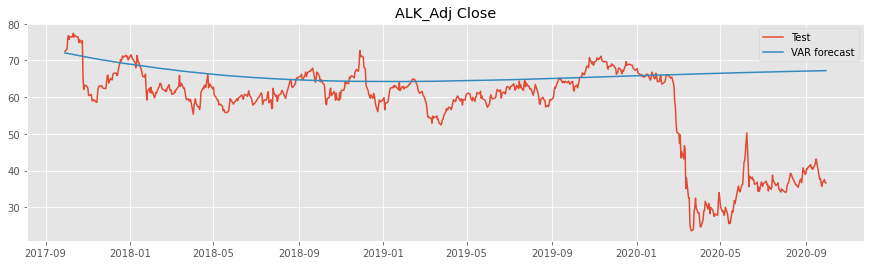

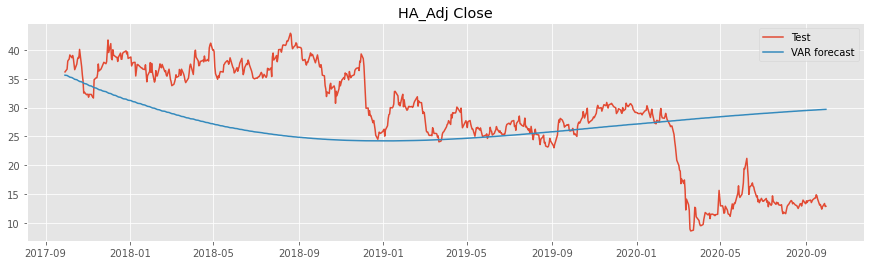

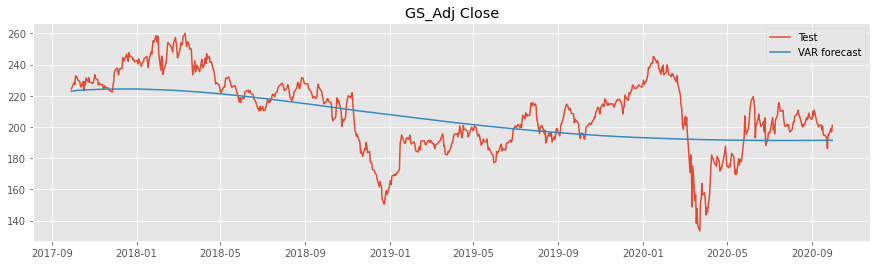

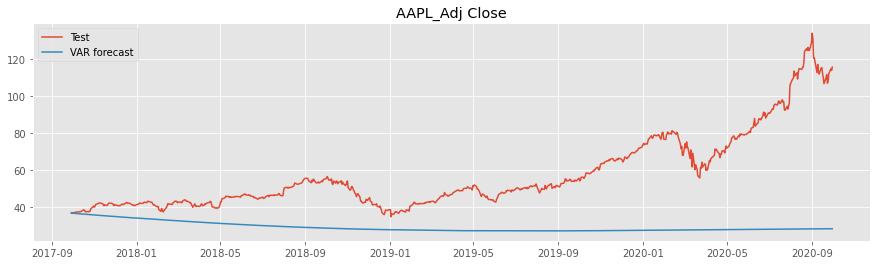

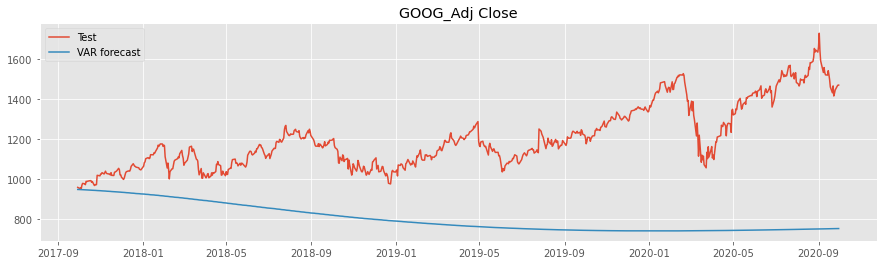

...

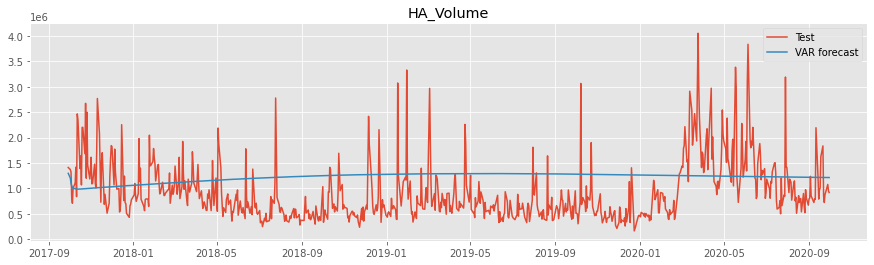

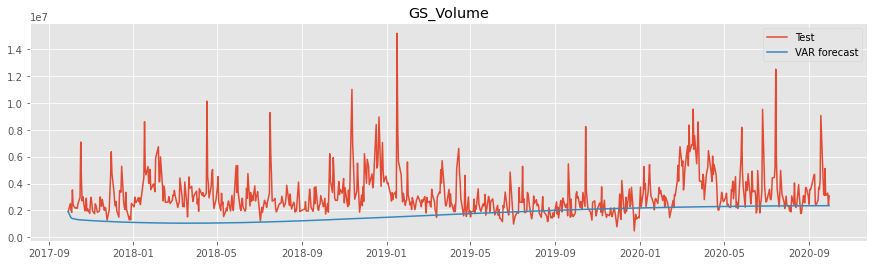

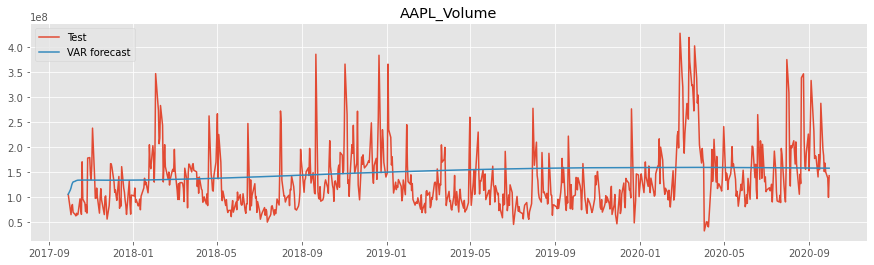

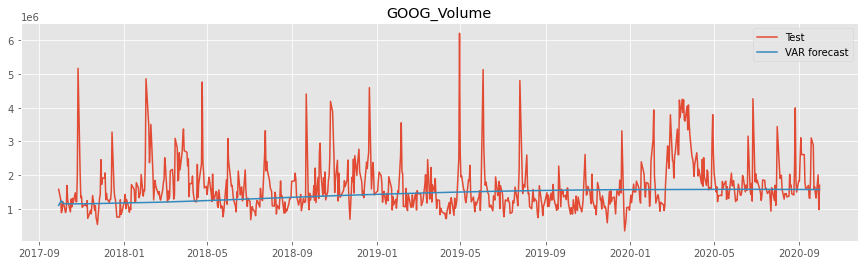

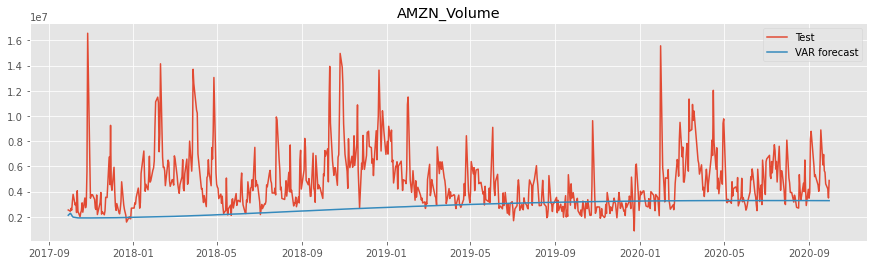

In [76]:
# Comparing the test and forecasted values
for col in forecast_df.columns:
    plt.figure(figsize=(15,4))
    plt.plot(forecast_df[col][train_len:], label='Test')
    plt.plot(forecast[col][:], label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

### Model Evaluation

In [77]:
# Model evaluation
from sklearn.metrics import mean_squared_error

eval_results = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])
tempResults = pd.DataFrame(columns=['Column', 'RMSE', 'MAPE'])

for col in forecast_df.columns:
    rmse = np.sqrt(mean_squared_error(test_data[col], forecast[col][:])).round(2)
    mape = np.round(np.mean(np.abs(test_data[col]-forecast[col][:])/test_data[col])*100,2)

    tempResults = pd.DataFrame({'Column':[col], 'RMSE': [rmse],'MAPE': [mape] })
    eval_results = pd.concat([eval_results, tempResults])
    
eval_results

,Column,RMSE,MAPE
0,ALK_Adj Close,14.93,24.20
0,HA_Adj Close,9.46,36.56
0,GS_Adj Close,19.72,7.59
0,AAPL_Adj Close,35.56,43.68
0,GOOG_Adj Close,452.07,31.82
0,AMZN_Adj Close,1312.84,59.79
0,ALK_Volume,1439767.06,44.60
0,HA_Volume,672203.17,91.35
0,GS_Volume,2170796.58,43.36
0,AAPL_Volume,63150126.29,45.99


## Predicting the situation for the next 7 days


In [78]:
#Re-making a model and fitting it
model_predict=VAR(forecast_df)
results_predict=model_predict.fit()

In [79]:
results_predict.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 13, Jun, 2021
Time:                     22:59:01
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                    187.485
Nobs:                     2516.00    HQIC:                   187.254
Log likelihood:          -278085.    FPE:                1.84708e+81
AIC:                      187.123    Det(Omega_mle):     1.73631e+81
--------------------------------------------------------------------
Results for equation ALK_Adj Close
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                     0.375761         0.168548            2.229           0.026
L1.ALK_Adj Close          0.993693         0.003310          300.210           0.000
L1.HA_Adj Close           0.006710  

In [80]:
#Using the forecast function
fc=results_predict.forecast(results_predict.y,steps=7)
fc

array([[3.66443030e+01, 1.28054348e+01, 2.00963839e+02, 1.16061318e+02,
        1.47186625e+03, 3.15337298e+03, 2.24903519e+06, 9.49291065e+05,
        3.47954273e+06, 1.72034696e+08, 1.85089585e+06, 4.80925036e+06],
       [3.66441210e+01, 1.27173380e+01, 2.00917802e+02, 1.16318514e+02,
        1.47412204e+03, 3.15839199e+03, 2.39658561e+06, 9.77265898e+05,
        3.70202466e+06, 1.90157662e+08, 1.94852584e+06, 4.83076283e+06],
       [3.66352563e+01, 1.26268468e+01, 2.00850329e+02, 1.16577906e+02,
        1.47634722e+03, 3.16355729e+03, 2.46696237e+06, 9.96713783e+05,
        3.82742253e+06, 2.01315821e+08, 2.00922008e+06, 4.87705533e+06],
       [3.66208404e+01, 1.25347524e+01, 2.00770760e+02, 1.16838079e+02,
        1.47854197e+03, 3.16877699e+03, 2.50257409e+06, 1.00943372e+06,
        3.89982283e+06, 2.08173314e+08, 2.04567022e+06, 4.92204430e+06],
       [3.66026815e+01, 1.24416000e+01, 2.00684151e+02, 1.17098528e+02,
        1.48071190e+03, 3.17401578e+03, 2.52175154e+06, 1.01

In [81]:
#Saving the forecasted values
forecasted_7_days=pd.DataFrame(fc,columns=forecast.columns)
forecasted_7_days['Date']=['01-10-2020','02-10-2020','03-10-2020','04-10-2020','05-10-2020','06-10-2020','07-10-2020']
forecasted_7_days['Date']=pd.to_datetime(forecasted_7_days["Date"],format='%d-%m-%Y')
forecasted_7_days.set_index(['Date'],inplace=True)
forecasted_7_days

,ALK_Adj Close,HA_Adj Close,GS_Adj Close,AAPL_Adj Close,GOOG_Adj Close,AMZN_Adj Close,ALK_Volume,HA_Volume,GS_Volume,AAPL_Volume,GOOG_Volume,AMZN_Volume
Date,,,,,,,,,,,,
2020-10-01,36.644303,12.805435,200.963839,116.061318,1471.866251,3153.372985,2.249035e+06,9.492911e+05,3.479543e+06,1.720347e+08,1.850896e+06,4.809250e+06
2020-10-02,36.644121,12.717338,200.917802,116.318514,1474.122038,3158.391986,2.396586e+06,9.772659e+05,3.702025e+06,1.901577e+08,1.948526e+06,4.830763e+06
2020-10-03,36.635256,12.626847,200.850329,116.577906,1476.347222,3163.557289,2.466962e+06,9.967138e+05,3.827423e+06,2.013158e+08,2.009220e+06,4.877055e+06
2020-10-04,36.620840,12.534752,200.770760,116.838079,1478.541973,3168.776989,2.502574e+06,1.009434e+06,3.899823e+06,2.081733e+08,2.045670e+06,4.922044e+06
2020-10-05,36.602681,12.441600,200.684151,117.098528,1480.711904,3174.015781,2.521752e+06,1.017770e+06,3.942296e+06,2.123789e+08,2.066730e+06,4.957980e+06
2020-10-06,36.581864,12.347753,200.593368,117.359109,1482.862999,3179.261419,2.532808e+06,1.023471e+06,3.967290e+06,2.149495e+08,2.078172e+06,4.984132e+06
2020-10-07,36.559052,12.253447,200.500093,117.619815,1485.000156,3184.510751,2.539697e+06,1.027648e+06,3.981764e+06,2.165113e+08,2.083632e+06,5.002069e+06


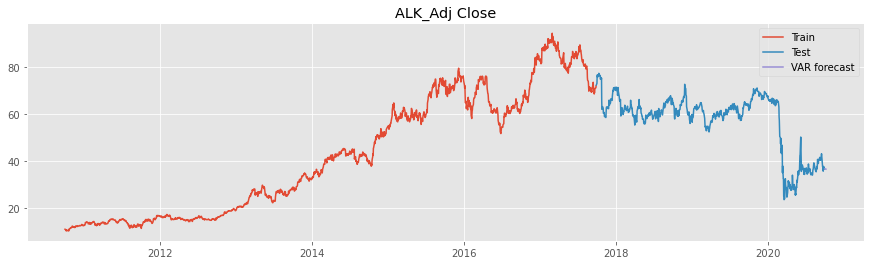

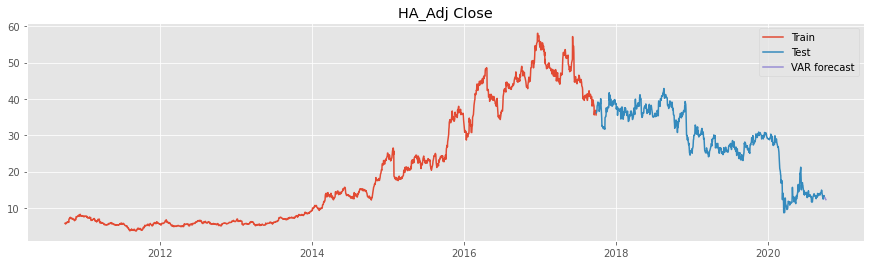

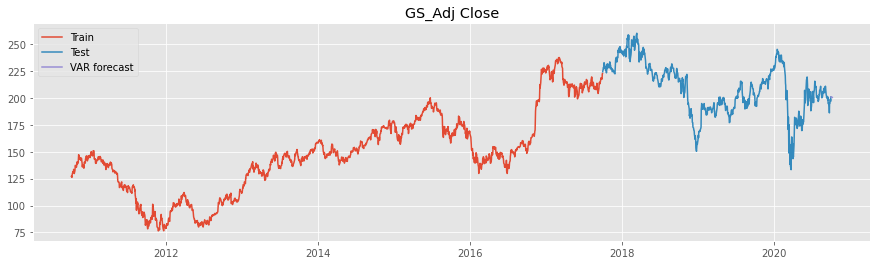

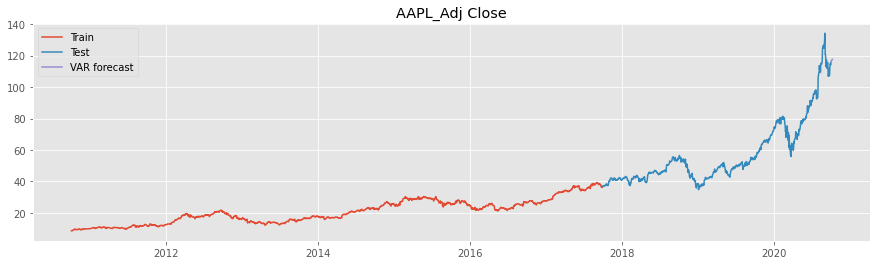

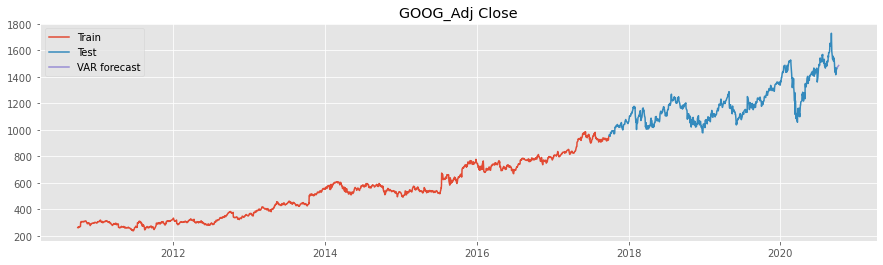

...

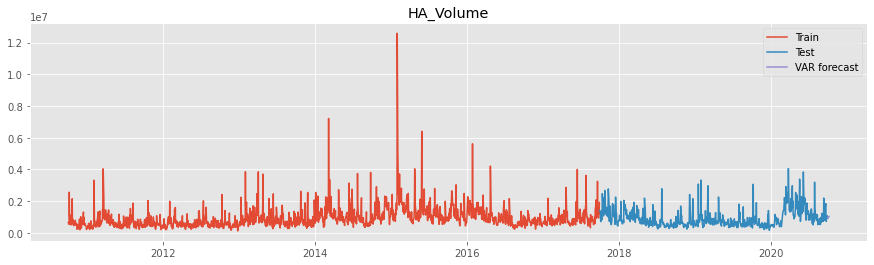

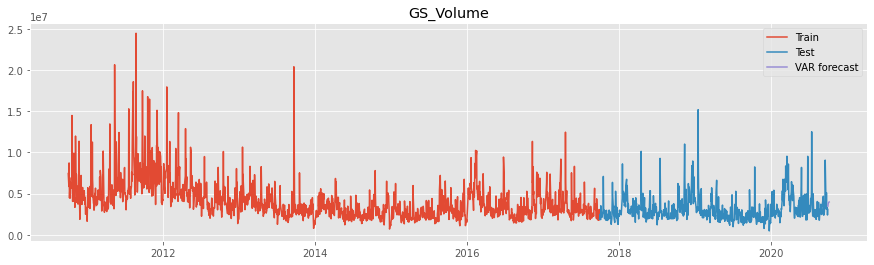

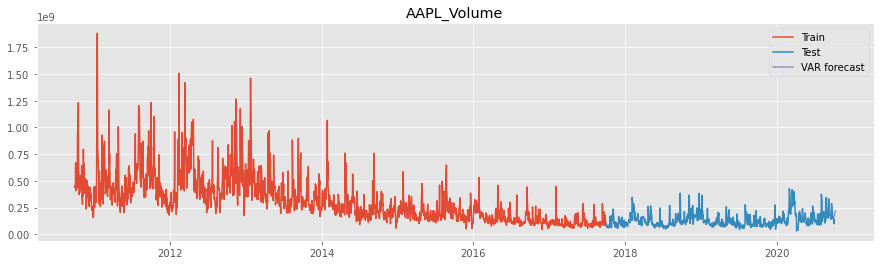

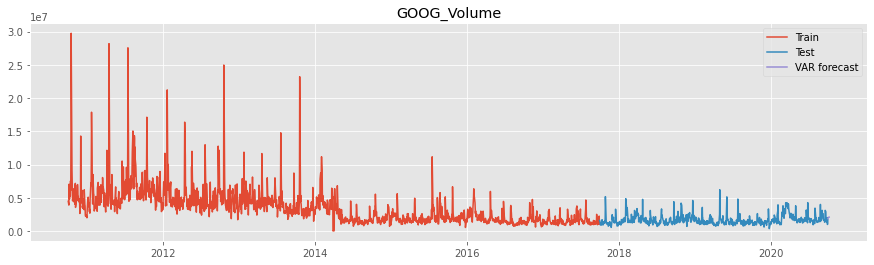

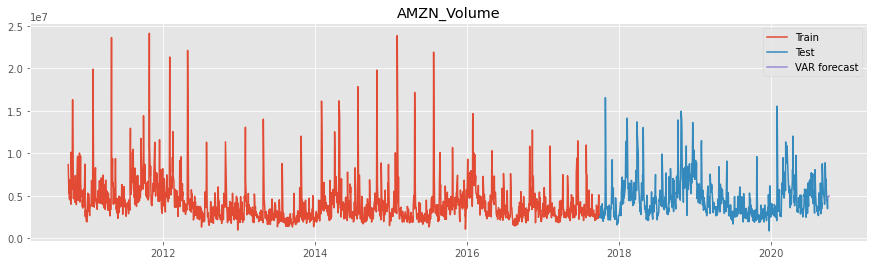

In [82]:
#Plotting the forecasted values for the next 7 days  
for col in forecast_df.columns:
    plt.figure(figsize=[15,4])
    plt.plot(forecast_df[col][:train_len],label='Train')
    plt.plot(forecast_df[col][train_len:],label='Test')
    plt.plot(forecasted_7_days[col][:],label='VAR forecast')
    plt.legend(loc='best')
    plt.title(col)
    plt.show()

### Concatinating the results from the forecast_df and the prediction of the next 7 days

In [83]:
final_cleaned_dataset=pd.DataFrame()
final_cleaned_dataset=pd.concat([forecast_df,forecasted_7_days])
final_cleaned_dataset.tail(10)

,ALK_Adj Close,HA_Adj Close,GS_Adj Close,AAPL_Adj Close,GOOG_Adj Close,AMZN_Adj Close,ALK_Volume,HA_Volume,GS_Volume,AAPL_Volume,GOOG_Volume,AMZN_Volume
Date,,,,,,,,,,,,
2020-09-28,37.540001,13.380000,199.070007,114.959999,1464.520020,3174.050049,2.922800e+06,1.076800e+06,3.280100e+06,1.376724e+08,2.007900e+06,4.224200e+06
2020-09-29,36.669998,12.860000,196.789993,114.089996,1469.329956,3144.879883,1.743500e+06,9.531000e+05,2.400000e+06,9.938220e+07,9.782000e+05,3.495800e+06
2020-09-30,36.630001,12.890000,200.970001,115.809998,1469.599976,3148.729980,1.921600e+06,9.167000e+05,3.073900e+06,1.426752e+08,1.700600e+06,4.883400e+06
2020-10-01,36.644303,12.805435,200.963839,116.061318,1471.866251,3153.372985,2.249035e+06,9.492911e+05,3.479543e+06,1.720347e+08,1.850896e+06,4.809250e+06
2020-10-02,36.644121,12.717338,200.917802,116.318514,1474.122038,3158.391986,2.396586e+06,9.772659e+05,3.702025e+06,1.901577e+08,1.948526e+06,4.830763e+06
2020-10-03,36.635256,12.626847,200.850329,116.577906,1476.347222,3163.557289,2.466962e+06,9.967138e+05,3.827423e+06,2.013158e+08,2.009220e+06,4.877055e+06
2020-10-04,36.620840,12.534752,200.770760,116.838079,1478.541973,3168.776989,2.502574e+06,1.009434e+06,3.899823e+06,2.081733e+08,2.045670e+06,4.922044e+06
2020-10-05,36.602681,12.441600,200.684151,117.098528,1480.711904,3174.015781,2.521752e+06,1.017770e+06,3.942296e+06,2.123789e+08,2.066730e+06,4.957980e+06
2020-10-06,36.581864,12.347753,200.593368,117.359109,1482.862999,3179.261419,2.532808e+06,1.023471e+06,3.967290e+06,2.149495e+08,2.078172e+06,4.984132e+06


In [84]:
final_cleaned_dataset.to_csv('C:/Users/vijmi/Desktop/final_cleaned_dataset.csv')